# Calculate the disturbance, the free-air anomaly, and their difference

Here, we'll load the raw gravity and topography data downloaded as part of the [Antarctic-Plots](https://antarctic-plots.readthedocs.io/) package and calculate the anomaly, the disturbance, and their difference. For all calculations, we'll use the WGS84 ellipsoid as the Normal Earth.

This notebook is originally from the supplement of the following article:
Oliveira, V. C., Uieda, L., & Hallam, K. A. T. (2018). Should geophysicists use the gravity disturbance or the anomaly?, 11. https://doi.org/10.5281/zenodo.1255305

In [8]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import os

import boule
import pygmt
import seaborn as sns
import verde
import verde as vd
import xarray as xr
from polartoolkit import fetch, maps, profiles, regions, utils

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"
sns.set_theme()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
region = regions.antarctica

## Collect data 
The data we need (in the form of netcdf or tiff files) can be downloaded and accessed with the package _Antarctic-Plots_ through the fetch module. 

These dataset will be returned as xarray DataArrays, which are 2D grids of a single variable.

In [9]:
eigen_gravity = fetch.gravity(version="eigen", spacing=10e3, region=region)

eigen_geoid = fetch.geoid(spacing=10e3, region=region)

surface = fetch.bedmap2(
    layer="surface",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)
icebase = fetch.bedmap2(
    layer="icebase",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,  # fills nans over ocean with 0's (while still reference to the geoid)
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)
bed = fetch.bedmap2(
    layer="bed",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,  # fills nans over ocean with 0's (while still reference to the geoid)
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)

grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


print out some info about the grids in the following format:

* spacing
* extent
* min value
* max value
* grid registration type

In [10]:
print("Eigen gravity info:", utils.get_grid_info(eigen_gravity))
print("Eigen geoid info:", utils.get_grid_info(eigen_geoid))

Eigen gravity info: (10000.0, (-2800000.0, 2800000.0, -2800000.0, 2800000.0), 978391.4375, 980167.625, 'g')
Eigen geoid info: (10000.0, (-2800000.0, 2800000.0, -2800000.0, 2800000.0), -66.1228713989, 45.4845733643, 'g')


merge the grids into 1 dataset and convert it from a 2D grid into a table

In [11]:
data = xr.merge(
    [
        eigen_gravity.rename("gravity"),
        eigen_geoid.rename("geoid"),
    ]
)
data

<xarray.Dataset> Size: 5MB
Dimensions:  (y: 561, x: 561)
Coordinates:
  * y        (y) float64 4kB -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
  * x        (x) float64 4kB -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
Data variables:
    gravity  (y, x) float64 3MB 9.784e+05 9.784e+05 ... 9.784e+05 9.784e+05
    geoid    (y, x) float64 3MB -17.31 -17.49 -17.64 ... 45.19 45.32 45.48
Attributes:
    Conventions:   CF-1.7
    title:         
    history:       gmt grdsample @GMTAPI@-S-I-G-M-G-N-000000 -G@GMTAPI@-S-O-G...
    description:   
    long_name:     z
    actual_range:  [978391.4375 980167.625 ]

In [12]:
# convert to a pandas dataframe
df = verde.grid_to_table(data)

# reproject epsg3031 back to lat lon
df = utils.epsg3031_to_latlon(df)

# rename observed gravity column
df = df.rename(
    columns={
        "gravity": "eigen_gravity",
        # "x":"easting",
        # "y":"northing",
    },
)

# add observation height column relative to ellipsoid and geoid
df["obs_height_ellipsoid"] = 10e3
df["obs_height_geoid"] = df.obs_height_ellipsoid + df.geoid

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797483,-14.109854,-70.501232,0.160142,10000.0,9985.890146
std,1.619468e+06,1.619468e+06,380.408069,28.106898,7.152484,103.404070,0.0,28.106898
min,-2.800000e+06,-2.800000e+06,978391.437500,-66.122871,-90.000000,-179.795373,10000.0,9933.877129
25%,-1.400000e+06,-1.400000e+06,979216.937500,-37.590157,-75.509262,-89.795373,10000.0,9962.409843
50%,0.000000e+00,0.000000e+00,979497.375000,-16.644913,-69.610713,0.000000,10000.0,9983.355087
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105
max,2.800000e+06,2.800000e+06,980167.625000,45.484573,-54.673529,180.000000,10000.0,10045.484573


plot all the datasets

In [20]:
eigen_gravity

<xarray.DataArray 'z' (y: 561, x: 561)> Size: 3MB
array([[978411.3125, 978413.8125, 978416.9375, ..., 978400.125 ,
        978395.75  , 978391.4375],
       [978414.4375, 978417.125 , 978420.9375, ..., 978406.    ,
        978401.75  , 978397.25  ],
       [978417.1875, 978420.5625, 978424.8125, ..., 978411.6875,
        978407.4375, 978402.875 ],
       ...,
       [978434.5   , 978444.8125, 978452.9375, ..., 978463.125 ,
        978460.5625, 978457.1875],
       [978422.3125, 978434.25  , 978444.5   , ..., 978458.625 ,
        978455.4375, 978451.8125],
       [978409.9375, 978420.8125, 978433.375 , ..., 978453.25  ,
        978449.5   , 978445.4375]])
Coordinates:
  * y        (y) float64 4kB -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
  * x        (x) float64 4kB -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
Attributes:
    Conventions:   CF-1.7
    title:         
    history:       gmt grdsample @GMTAPI@-S-I-G-M-G-N-000000 -G@GMTAPI@-S-O-G...
    description:   
    long_name:     z
    actual_range:  [978391.4375 980167.625 ]

/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(


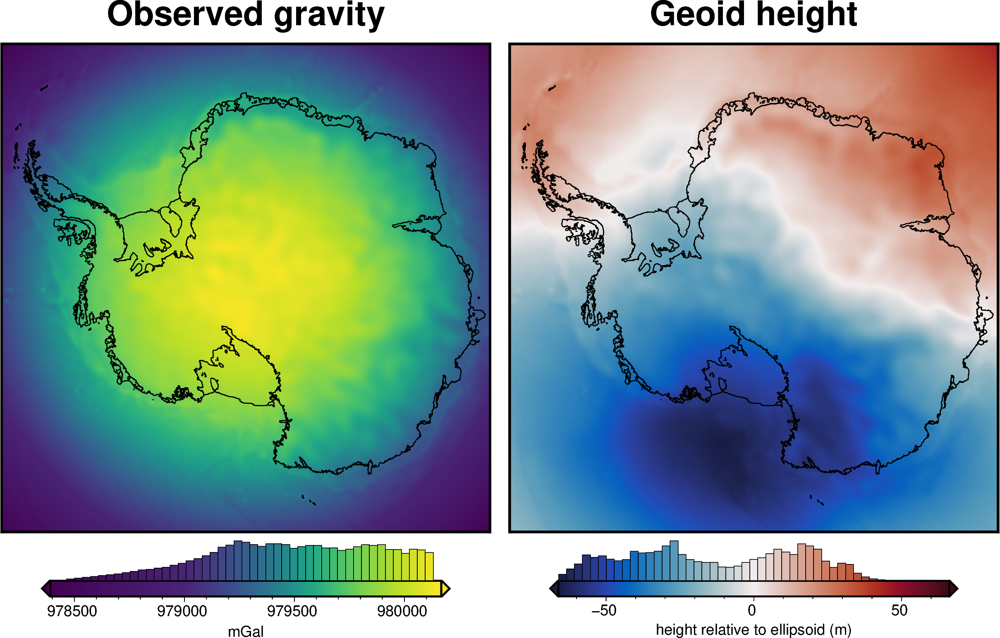

In [22]:
# plot gravity data
fig = maps.plot_grd(
    eigen_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Observed gravity",
    # shading="+a45+nt0.2",
    # shading=True,
    hist=True,
    cbar_yoffset=1,
    hist_bin_num=50,
)

# get max absolute value of geoid
maxabs = verde.maxabs(eigen_geoid)
# plot geoid
fig = maps.plot_grd(
    eigen_geoid,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    cmap="balance+h0",
    cpt_lims=[-maxabs, maxabs],
    cbar_label="height relative to ellipsoid (m)",
    title="Geoid height",
    hist=True,
    cbar_yoffset=1,
    hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

## Calculate Normal gravity
at 10km altitude, relative to the ellipsoid

In [23]:
# calculated normal gravity at all Eigen observation locations for a given latitude and height
df["normal_gravity"] = boule.WGS84.normal_gravity(
    latitude=df.lat,
    height=df.obs_height_ellipsoid,
)

# convert back to a grid from a dataframe
normal_gravity = df.set_index(["y", "x"]).to_xarray().normal_gravity

## Calculate gravity disturbance

Gravity disturbances are the differences between the measured gravity and a reference (normal) gravity produced by an ellipsoid:

$$
\delta g (p) = g (p) - \gamma (p)
$$

<img src="../../figures/disturbance_vs_anomaly_tenzer_et_al_2018.JPG" width="400"/>

From [Tenzer et al. 2018](https://doi.org/10.1007/s10712-018-9504-0)

in which $\delta g$ is the **gravity disturbance**, $g$ is the **measured gravity**, $\gamma$ is the **normal gravity** and p is the observation point where the gravity measurement has been carried out.

In [24]:
gravity_disturbance = eigen_gravity - normal_gravity

df["disturbance"] = df.eigen_gravity - df.normal_gravity

/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(
/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(


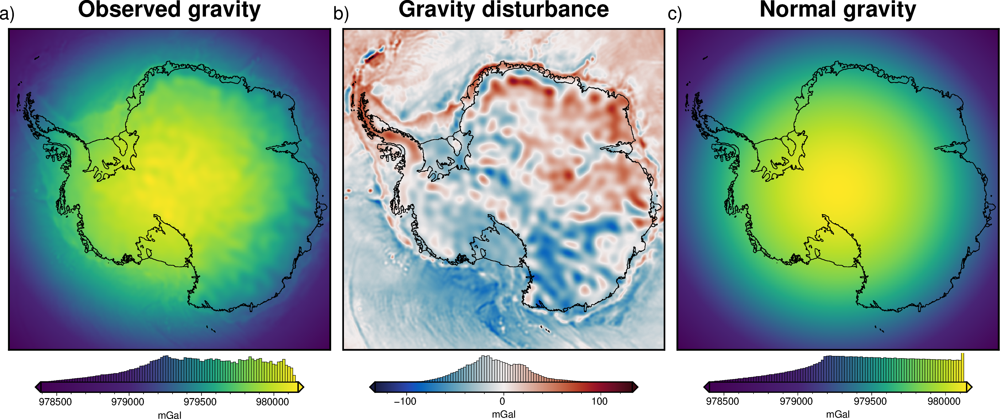

In [36]:
# plot observed gravity
fig = maps.plot_grd(
    eigen_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Observed gravity",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# get max absolute value of the disturbance
maxabs = verde.maxabs(gravity_disturbance)
# plot gravity disturbance
fig = maps.plot_grd(
    gravity_disturbance,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    cmap="balance+h0",
    cpt_lims=[-maxabs, maxabs],
    cbar_label="mGal",
    title="Gravity disturbance",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot normal gravity
fig = maps.plot_grd(
    normal_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Normal gravity",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig.show()

## Calculate free-air anomaly

Next, we calculate the free-air anomaly:

$$
\Delta g^F = \left(g(p) + 0.3086 H(p)\right) - \gamma_Q
$$

in which $g$ is the **measured gravity**, $H$ is the **orthometric height** (geoidal) of the observation point and $\gamma_Q$ is the **normal gravity** calculated on the surface of the ellipsoid (to account for latitudinal variations).

In [37]:
# # METHOD 1
# # calculated normal gravity on the ellipsoid (height=0)
# df['normal_gravity_on_ellipsoid'] = boule.WGS84.normal_gravity(
#     latitude = df.lat,
#     height = 0,
#     )

# # compute the anomaly from the above equation
# df['free_air_anomaly'] = (df.gravity + 0.3086*df.obs_height_geoid) - df.normal_gravity_on_ellipsoid

# METHOD 2
# calculated normal gravity on the ellipsoid (height=0)
df["normal_gravity_geoid"] = boule.WGS84.normal_gravity(
    latitude=df.lat,
    height=df.obs_height_geoid,
)

# convert results back to a grid
normal_gravity_geoid = df.set_index(["y", "x"]).to_xarray().normal_gravity_geoid

# compute the anomaly from the above equation
df["free_air_anomaly"] = df.eigen_gravity - df.normal_gravity_geoid

# convert results back to a grid
free_air_anomaly = df.set_index(["y", "x"]).to_xarray().free_air_anomaly

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,normal_gravity_geoid,free_air_anomaly,geoid_time_0.3086
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797483,-14.109854,-70.501232,0.160142,10000.0,9985.890146,979498.184552,-9.387069,979502.515389,-13.717906,4.354301
std,1.619468e+06,1.619468e+06,380.408069,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,387.009498,36.944802,8.673789
min,-2.800000e+06,-2.800000e+06,978391.437500,-66.122871,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,978387.832751,-112.517077,-14.036539
25%,-1.400000e+06,-1.400000e+06,979216.937500,-37.590157,-75.509262,-89.795373,10000.0,9962.409843,979222.512686,-29.984284,979225.486254,-40.384842,-3.543378
50%,0.000000e+00,0.000000e+00,979497.375000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,979514.282850,-15.852943,5.136620
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,979822.211418,14.615214,11.600322
max,2.800000e+06,2.800000e+06,980167.625000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,980151.394525,140.368055,20.405518


/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(
/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(


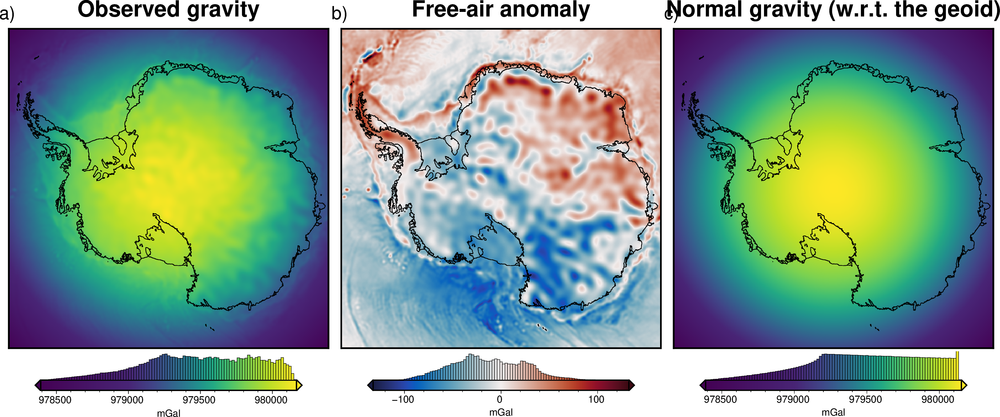

In [47]:
# plot observed gravity
fig = maps.plot_grd(
    eigen_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Observed gravity",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# get max absolute value of the disturbance
maxabs = verde.maxabs(gravity_disturbance)
# plot gravity disturbance
fig = maps.plot_grd(
    free_air_anomaly,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    cmap="balance+h0",
    cpt_lims=[-maxabs, maxabs],
    cbar_label="mGal",
    title="Free-air anomaly",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot normal gravity
fig = maps.plot_grd(
    normal_gravity_geoid,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Normal gravity (w.r.t. the geoid)",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig.show()

## profiles

In [48]:
# lines = profiles.draw_lines()

In [49]:
# # get clicked points
# df = utils.shapes_to_df(lines)
# # extract first and last
# a = (df.x.iloc[0], df.y.iloc[0])
# b = (df.x.iloc[-1], df.y.iloc[-1])

a, b = (
    (-1389631.4489983942, -1352746.2662278207),
    (2083349.1138809533, 1817557.53318993),
)
a, b

((-1389631.4489983942, -1352746.2662278207),
 (2083349.1138809533, 1817557.53318993))

In [50]:
data_grids = [
    gravity_disturbance,
    free_air_anomaly,
    eigen_gravity,
    normal_gravity,
]
data_names = [
    "Disturbance",
    "Anomaly",
    "Observed gravity",
    "Normal gravity",
]

data_dict = profiles.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        "black",
        "red",
        "blue",
        "darkorange",
    ],
    axes=[0, 0, 1, 1],
)
layer_names = [
    "ice",
    "water",
    "earth",
]
layer_colors = [
    "lightskyblue",
    "darkblue",
    "lightbrown",
]
layer_grids = [surface, icebase, bed]

layers_dict = profiles.make_data_dict(
    names=layer_names,
    grids=layer_grids,
    colors=layer_colors,
)

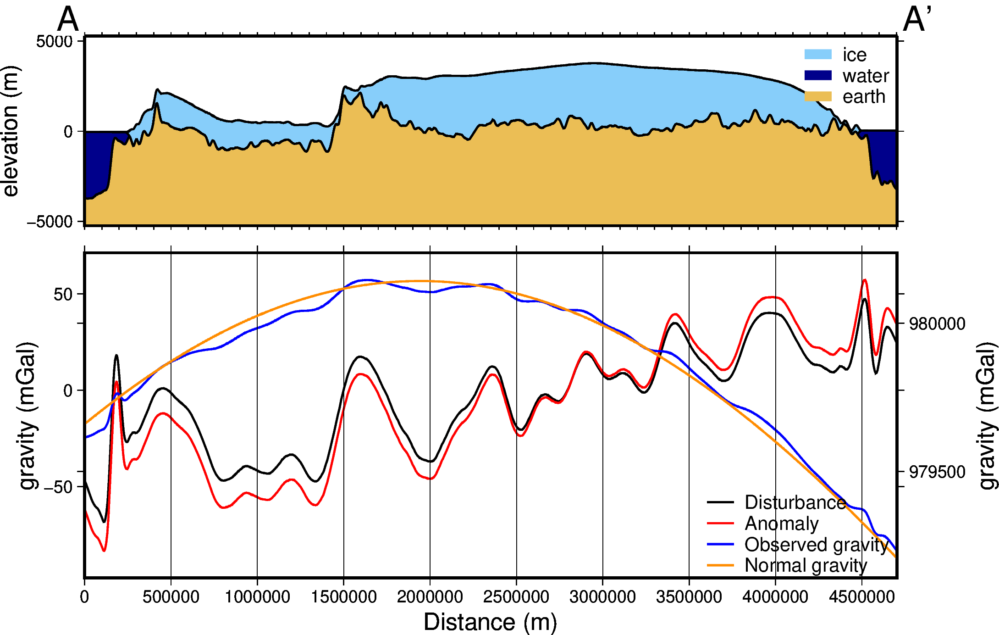

In [51]:
fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=a,
    stop=b,
    num=10000,
    data_height=6,
    fig_height=10,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jBR+o0c/-.1c",
    data_buffer=0.1,
    data_frame=[
        ["nesW", "ya+lgravity (mGal)"],
        ["nESw", "ya+lgravity (mGal)", "xag+lDistance (m)"],
    ],
    # data_pen_style=[None, None, ".", None],
    share_yaxis=True,
    layers_dict=layers_dict,
    layers_legend=True,
    layer_buffer=0.2,
    layers_legend_loc="jTR",
    layers_pen_color="black",
    layers_frame=["nesW", "ya+lelevation (m)", "xf"],
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
fig.show()

/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(
/home/mdtanker/polartoolkit/src/polartoolkit/maps.py:1197: UserWarning: getting max/min values from grid, if cpt_lims were used to create the colorscale, histogram will not properly align with colorbar!
  add_colorbar(


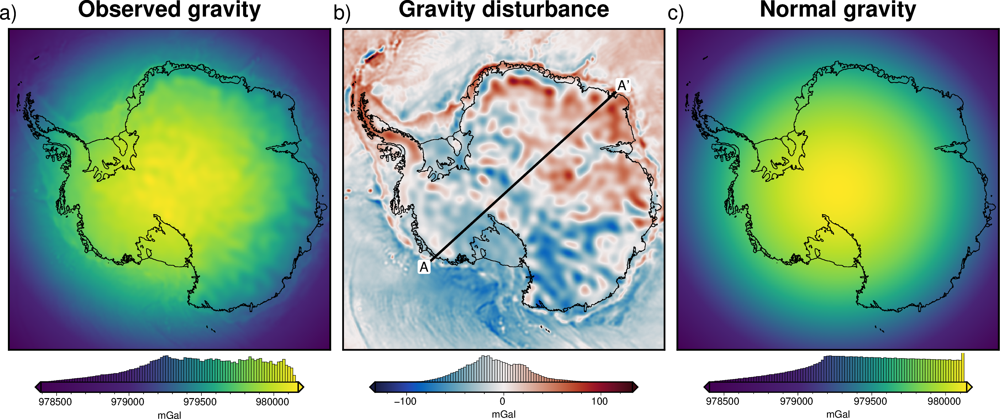

In [56]:
# plot observed gravity
fig = maps.plot_grd(
    eigen_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Observed gravity",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
)

fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="18p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# get max absolute value of the disturbance
maxabs = verde.maxabs(gravity_disturbance)
# plot gravity disturbance
fig = maps.plot_grd(
    gravity_disturbance,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    cmap="balance+h0",
    cpt_lims=[-maxabs, maxabs],
    cbar_label="mGal",
    title="Gravity disturbance",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="18p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(a, b, size=100),
    pen="2p,black",
)
fig.text(
    x=a[0],
    y=a[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
)
fig.text(
    x=b[0],
    y=b[1],
    text="A'",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
)


# plot normal gravity
fig = maps.plot_grd(
    normal_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Normal gravity",
    # shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="18p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig.show()

## Compare the disturbance and the anomaly

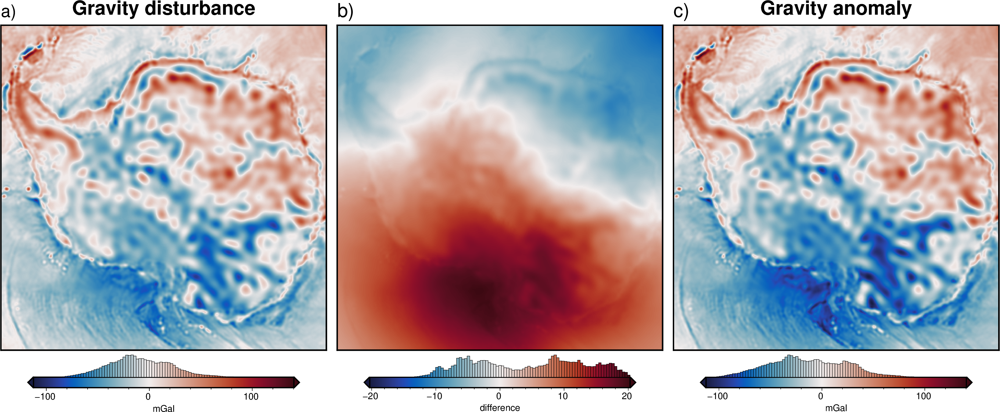

In [60]:
# compare grids
eigen_diff_grids = utils.grd_compare(
    gravity_disturbance,
    free_air_anomaly,
    plot=True,
    grid1_name="Gravity disturbance",
    grid2_name="Gravity anomaly",
    cbar_label="mGal",
    title="",
    rmse_in_title=False,
    inset=False,
    cmap="balance+h",
    diff_cmap="balance",
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    # shading="+a45+nt0.2",
)

## Compare to values given by the AntGG 2020 prereleased data

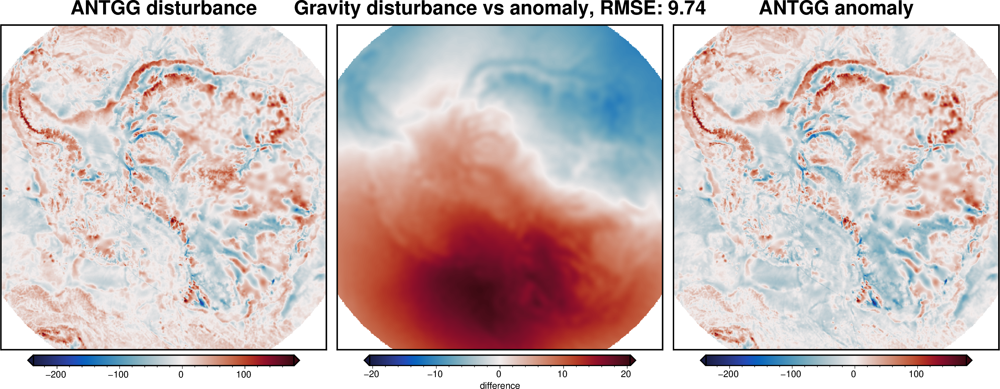

In [61]:
# fetch the AntGG gravity disturbance
ANTGG_disturbance = fetch.gravity(
    version="antgg-update",
    anomaly_type="DG",
    resolution=10e3,
    region=region,
    registration="g",
)

# fetch the AntGG free-air-anomaly
ANTGG_anomaly = fetch.gravity(
    version="antgg-update",
    anomaly_type="FA",
    resolution=10e3,
    region=region,
    registration="g",
)

# compare grids
anttgg_diff_grids = utils.grd_compare(
    ANTGG_disturbance,
    ANTGG_anomaly,
    plot=True,
    grid1_name="ANTGG disturbance",
    grid2_name="ANTGG anomaly",
    title="Gravity disturbance vs anomaly",
    inset=False,
    cmap="balance+h",
    diff_cmap="balance",
)

## What is the actual difference?

Here, we multiply the geoid model by -0.3086mGal to show that the difference between the disturbance and the anomaly is approximated very closely as the the free air correction 

Free-air correction = $0.3086 H(p)$

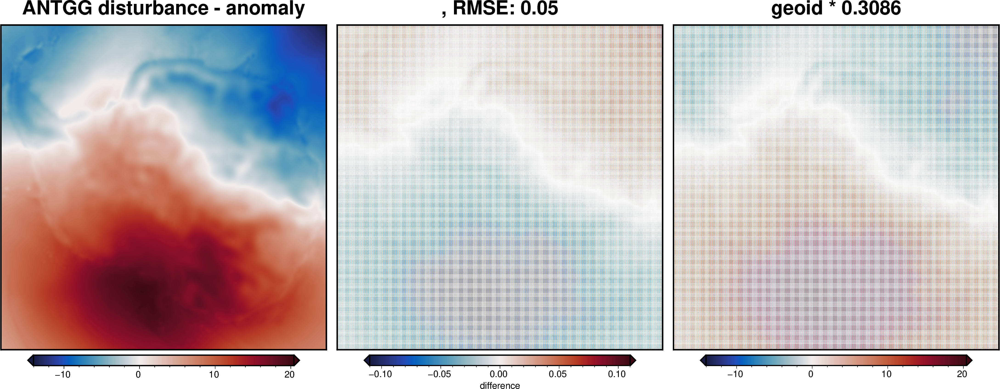

In [62]:
df["geoid_times_0.3086"] = df.geoid * -0.3086

# convert to a grid
grid = pygmt.xyz2grd(
    data=df[["x", "y", "geoid_times_0.3086"]],
    region=region,
    spacing=5000,
    registration="g",
)

# compare grids
grids = utils.grd_compare(
    eigen_diff_grids[0],  # difference between AnttGG disturbance and anomaly
    grid,
    plot=True,
    grid1_name="ANTGG disturbance - anomaly",
    grid2_name="geoid * 0.3086",
    title="",
    inset=False,
    cmap="balance+h",
    diff_cmap="balance",
)